In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
from fbprophet import Prophet
from IPython.display import display,HTML
%matplotlib inline

Importing plotly failed. Interactive plots will not work.


<h1><center> Importing Data 

In [19]:
df = pd.read_csv("AC_Data.csv").dropna()
df['Date'] = pd.to_datetime(df['0'])
df = df.drop('0',axis =1).set_index('Date')
display(HTML(df.head().to_html()))

,AC 1,AC 2,AC 3,AC 4,AC 5,AC 6,AC 7,AC 8,AC 9,AC 10,AC 11,AC 12,AC 13,AC 14,AC 15,AC 16,AC 17,AC 18
Date,,,,,,,,,,,,,,,,,,
2019-08-01 00:00:00,7.518632,8.788315,0.0,0.0,2.617045,4.079041,2.782276,4.624447,5.222060,2.151238,1.585072,0.560373,3.142941,2.749470,5.417774,4.113460,3.305072,6.735981
2019-08-01 00:02:00,7.426114,8.940615,0.0,0.0,2.581625,3.781231,2.529366,5.057423,5.349465,2.414715,2.168184,1.818730,3.085110,2.720484,3.302422,3.986483,3.220588,6.379500
2019-08-01 00:04:00,7.052986,9.161103,0.0,0.0,2.592095,3.800127,2.332304,6.322521,3.995392,2.237114,3.345624,2.310409,3.132799,2.676861,3.539026,3.797881,3.131560,6.363475
2019-08-01 00:06:00,6.665446,9.065626,0.0,0.0,2.575639,3.772891,2.596200,5.805132,3.553778,1.878356,2.737645,2.510972,3.090007,2.666604,4.607439,3.062610,3.063953,6.127366
2019-08-01 00:08:00,6.674838,9.096130,0.0,0.0,2.021472,3.155697,2.845417,6.315060,3.042244,1.914650,2.452500,2.171791,3.097202,2.710572,5.332696,2.640150,2.864680,5.662474


<h1><center> Initial Analysis using pairplot

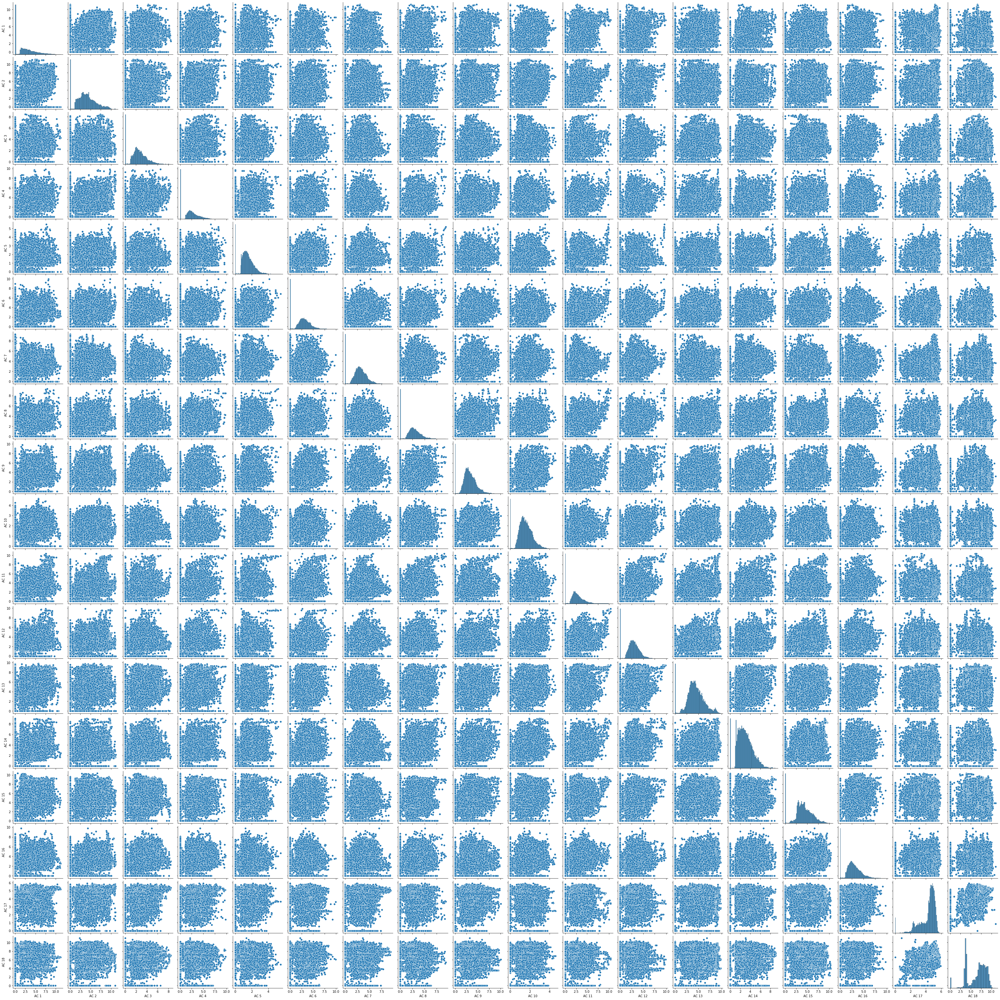

In [3]:
sns.pairplot(df)

### Nothing can be concluded from these pair-plots

### <span style="color:red"> Tried a bunch of APIs to collect temperature data, but unsuccessful. Some did not work. Others were Paid. </span> 

In [4]:
import requests

url = "https://visual-crossing-weather.p.rapidapi.com/forecast"

querystring = {"aggregateHours":"24","location":"Washington,DC,USA","contentType":"csv","unitGroup":"us","shortColumnNames":"0"}

headers = {
    'x-rapidapi-host': "visual-crossing-weather.p.rapidapi.com",
    'x-rapidapi-key': "04105d6946mshac13b0cd8141cf4p128e31jsne96aca6920d7"
    }

response = requests.request("GET", url, headers=headers, params=querystring)

print(response.text)

{"message":"You are not subscribed to this API."}


In [5]:
sum_df = pd.DataFrame(df.sum(),columns = ['name']).sort_values(by='name')


# <h1><center> Correlation Matrix

In [6]:
corr = df.corr()
corr.style.background_gradient().set_precision(4)

,AC 1,AC 2,AC 3,AC 4,AC 5,AC 6,AC 7,AC 8,AC 9,AC 10,AC 11,AC 12,AC 13,AC 14,AC 15,AC 16,AC 17,AC 18
AC 1,1.0000,0.4160,0.2334,0.2811,0.0837,0.2040,0.0305,0.0997,0.1085,0.2002,0.3113,0.1846,0.2654,0.1808,0.3197,0.2812,-0.0931,-0.0357
AC 2,0.4160,1.0000,0.2131,0.3621,0.0940,0.1696,0.0679,0.0948,0.1471,0.1815,0.1943,0.1235,0.2379,0.1127,0.2917,0.2447,0.0395,-0.0432
AC 3,0.2334,0.2131,1.0000,0.2504,0.0565,0.0853,0.0047,0.0993,0.1250,0.0714,0.1433,0.1061,0.2131,0.1001,0.2701,0.2615,0.0256,0.0270
AC 4,0.2811,0.3621,0.2504,1.0000,0.1146,0.1487,0.0856,0.1605,0.1693,0.1850,0.1286,0.1503,0.2279,0.1826,0.1984,0.1779,0.0241,-0.0552
AC 5,0.0837,0.0940,0.0565,0.1146,1.0000,0.2255,0.1130,0.1180,0.1188,0.1211,0.1328,0.1053,0.0882,0.2019,0.0433,0.0479,0.0295,-0.0159
AC 6,0.2040,0.1696,0.0853,0.1487,0.2255,1.0000,0.1951,0.2107,0.1852,0.2062,0.2681,0.1803,0.2199,0.3051,0.1746,0.1626,-0.0502,-0.0914
AC 7,0.0305,0.0679,0.0047,0.0856,0.1130,0.1951,1.0000,0.1884,0.2126,0.2030,0.1694,0.2152,0.1299,0.2366,0.1214,0.0633,-0.0154,-0.0618
AC 8,0.0997,0.0948,0.0993,0.1605,0.1180,0.2107,0.1884,1.0000,0.1947,0.2050,0.1909,0.2344,0.1557,0.3364,0.1211,0.1314,-0.0963,-0.1246
AC 9,0.1085,0.1471,0.1250,0.1693,0.1188,0.1852,0.2126,0.1947,1.0000,0.2078,0.1757,0.1827,0.1871,0.2789,0.1725,0.1246,-0.0285,-0.0880
AC 10,0.2002,0.1815,0.0714,0.1850,0.1211,0.2062,0.2030,0.2050,0.2078,1.0000,0.1888,0.2042,0.1845,0.2929,0.2299,0.2495,-0.1796,-0.1435


### We can observe that the usage of AC 17 is highly correlated with the usage of AC 18 and the usage of AC 1 is highly correlated  with the usage of AC 2.

#  <h1><center> <span style="color:black"> Most/Least Used AC </span> </h1></center>

In [7]:
print('-'*30)

print("Least Used AC: ",sum_df.index[0])
print("Total amount: ",int(sum_df.loc[sum_df.index[0]][0]))

print('-'*30)

print("Most Used AC: ",sum_df.index[-1],"")
print("Total amount: ",int(sum_df.loc[sum_df.index[-1]][0]))

print('-'*30)

------------------------------
Least Used AC:  AC 5
Total amount:  50800
------------------------------
Most Used AC:  AC 18 
Total amount:  223573
------------------------------


In [8]:
# from datetime import datetime
# import matplotlib.pyplot as plt
# #from meteostat import Point, Daily

# # Set time period
# start = datetime(2018, 1, 1)
# end = datetime(2018, 12, 31)

# # Create Point for Vancouver, BC
# #location = Point(49.2497, -123.1193, 70)

# # Get daily data for 2018
# data = Daily(49.2497, -123.1193, start, end)
# data = data.fetch()


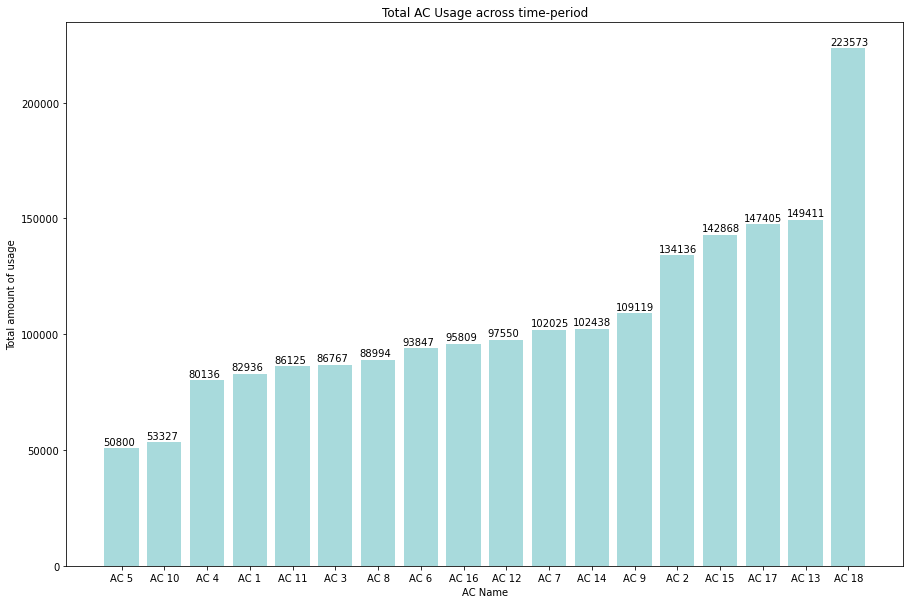

In [9]:
fig, ax = plt.subplots(figsize = (15,10))
plt.bar(sum_df.index, sum_df.name, color='#a8dadc', width=0.8)
for i, v in enumerate(sum_df.name):
    ax.text(i-len(sum_df.name)*0.024, v+1500, str(int(v)))
plt.title('Total AC Usage across time-period')
plt.xlabel('AC Name')
plt.ylabel('Total amount of usage')
plt.show()

In [10]:
daily_sum = df.groupby(pd.Grouper(freq="D")).sum()
weekly_sum = df.groupby(pd.Grouper(freq="W")).sum()

<h1><center> Weekly Usage Trends

In [11]:
x_week = [i.isocalendar()[1] for i in weekly_sum.index]

In [12]:
x_day = [i.date().strftime('%Y-%m-%d') for i in daily_sum.index]


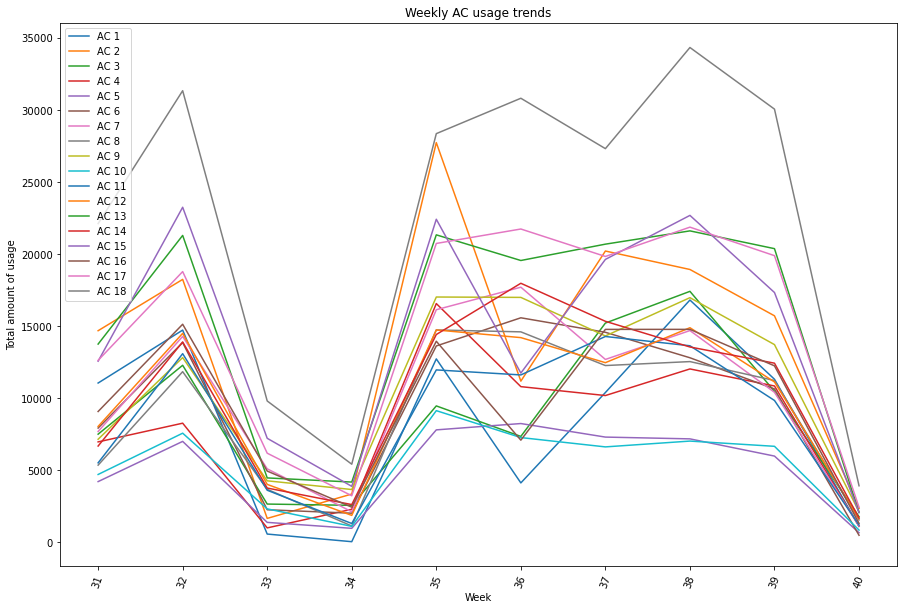

In [13]:
fig, ax = plt.subplots(figsize = (15,10))
for ac in list(weekly_sum):
    plt.plot(x_week,weekly_sum[ac] ,label = ac)
plt.legend(loc="upper left")
plt.title('Weekly AC usage trends')
plt.xlabel('Week')
plt.ylabel('Total amount of usage')
plt.xticks(x_week,rotation = 70)
plt.show()

## The sudden dip in usage at week 33 could be due to the fact that hotel is closed for booking. 
### It can be noted that Usage is not absolute 0 for all ACs. 

<h1><center> Correlation Trends for weekly usage

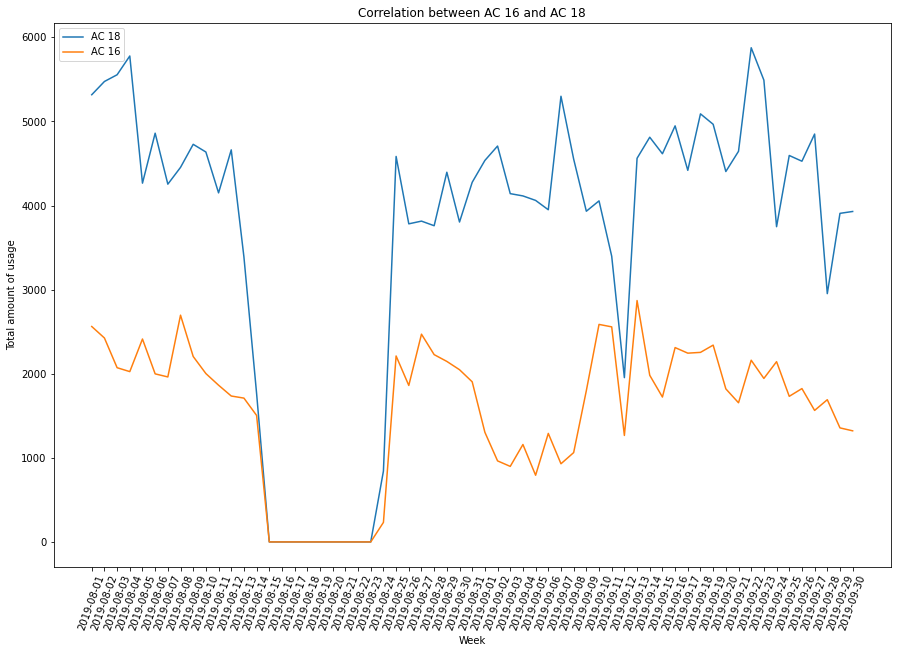

In [14]:
fig, ax = plt.subplots(figsize = (15,10))
plt.plot(x_day,daily_sum['AC 18'] ,label = 'AC 18')
plt.plot(x_day,daily_sum['AC 16'] ,label = 'AC 16')
plt.legend(loc="upper left")
plt.title('Correlation between AC 16 and AC 18')
plt.xlabel('Week')
plt.ylabel('Total amount of usage')
plt.xticks(x_day,rotation=70)
plt.show()

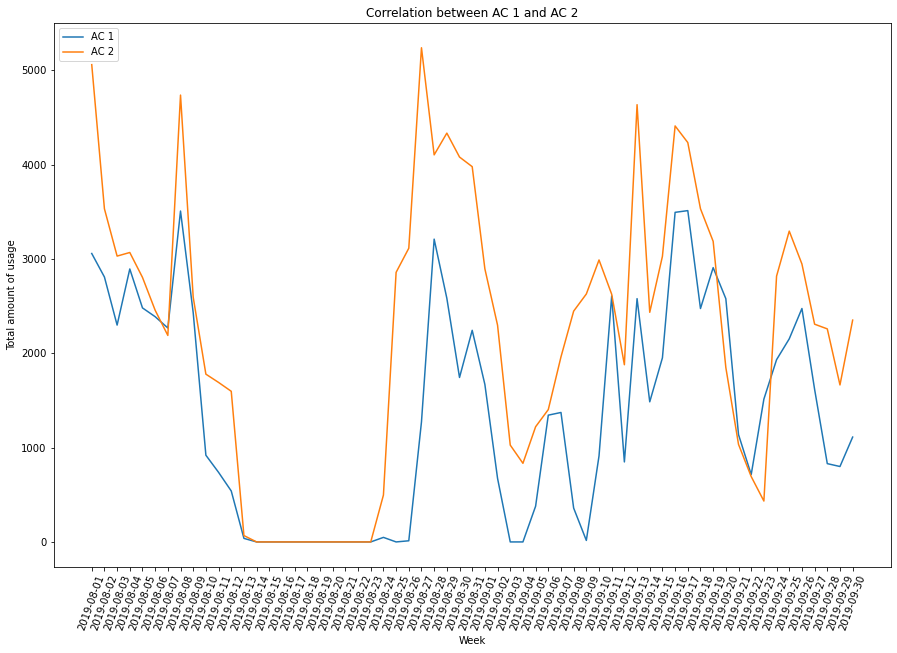

In [15]:
fig, ax = plt.subplots(figsize = (15,10))
plt.plot(x_day,daily_sum['AC 1'] ,label = 'AC 1')
plt.plot(x_day,daily_sum['AC 2'] ,label = 'AC 2')
plt.legend(loc="upper left")
plt.title('Correlation between AC 1 and AC 2')
plt.xlabel('Week')
plt.ylabel('Total amount of usage')
plt.xticks(x_day,rotation=70)
plt.show()

<h1><center> Forecasting Daily Usage Metrics for next 10 days

In [16]:
def get_df_forecast_model(df_name,col_name):  
    df_to_forecast = pd.DataFrame()
    df_to_forecast['y'] = df_name[col_name]
    df_to_forecast['ds'] = df_name.index
    df_to_forecast.reset_index(inplace = True)
    df_to_forecast.drop('Date',inplace = True ,axis = 1)
    forecast_model = Prophet(interval_width=0.95)
    forecast_model.fit(df_to_forecast)
    return(forecast_model)

In [17]:
def show_forecast_results(forecast_model,name):
    print('*'*100)
    print('-'*100)
    _forecast = forecast_model.make_future_dataframe(periods=10, freq='D')
    _forecast = forecast_model.predict(_forecast)
    plt.figure(figsize=(18, 6))
    forecast_model.plot(_forecast, xlabel = 'Date', ylabel = name)
    plt.title('10 days Forecast for '+name)

    fig, ax = plt.subplots(figsize = (15,10))
    known, = plt.plot(_forecast['ds'].iloc[:-10] ,_forecast['yhat'].iloc[:-10],label = name+'  Known Usage')
    forecasted, = plt.plot(_forecast['ds'].iloc[-10:] ,_forecast['yhat'].iloc[-10:],label = name + ' forecast usage')
    plt.legend(loc="upper left")
    plt.title('10 Days Forecast for '+ name)
    plt.xlabel('Date')
    plt.ylabel('Total amount of Daily usage')
    plt.xticks(_forecast['ds'],rotation=70)
    plt.show()
    print('-'*15," Forcasted Values for ",name," ", '-'*15)
    forecasting_df_only_values = (_forecast[['ds','yhat']].iloc[-10:])
    forecasting_df_only_values['Date'] = forecasting_df_only_values['ds'].dt.date
    forecasting_df_only_values['Usage'] = forecasting_df_only_values['yhat']
    forecasting_df_only_values.drop(['ds','yhat'],inplace = True,axis = 1)
    style_df = forecasting_df_only_values.style.background_gradient()
    display(HTML(style_df.render()))
    #jh_forecast.iloc[:-11].style.background_gradient()

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


****************************************************************************************************
----------------------------------------------------------------------------------------------------


<Figure size 1296x432 with 0 Axes>

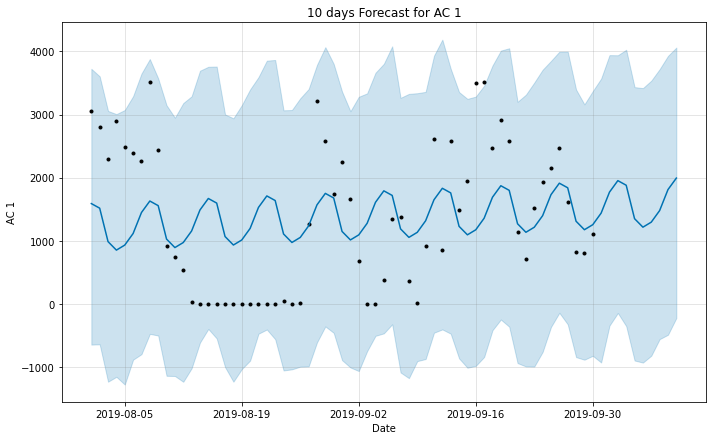

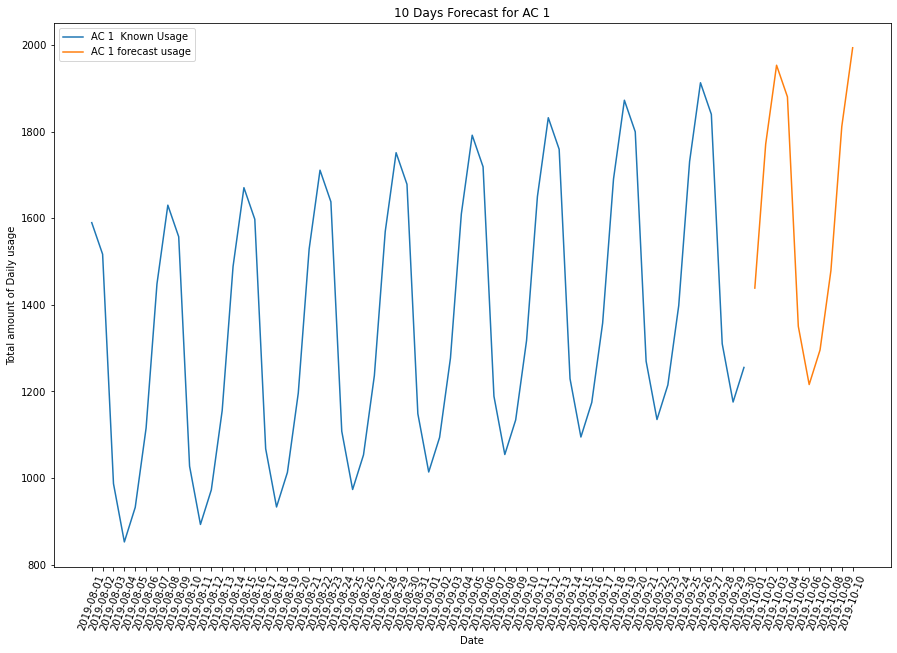

---------------  Forcasted Values for  AC 1   ---------------


,Date,Usage
61,2019-10-01,1438.503798
62,2019-10-02,1771.153914
63,2019-10-03,1953.144364
64,2019-10-04,1880.209804
65,2019-10-05,1350.335550
66,2019-10-06,1215.799958
67,2019-10-07,1295.647470
68,2019-10-08,1478.901367
69,2019-10-09,1811.551482
70,2019-10-10,1993.541933


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


****************************************************************************************************
----------------------------------------------------------------------------------------------------


<Figure size 1296x432 with 0 Axes>

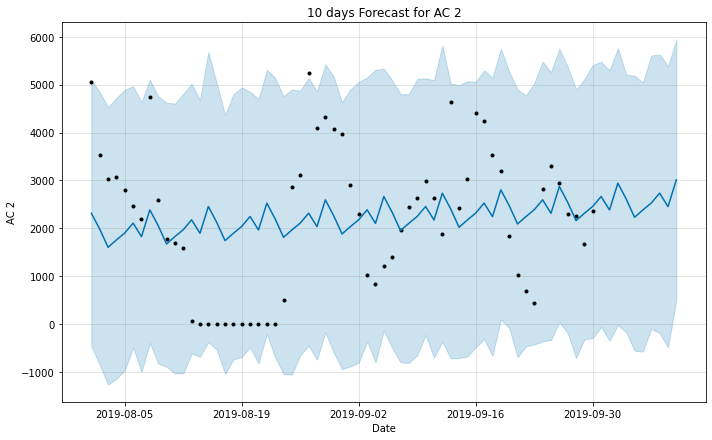

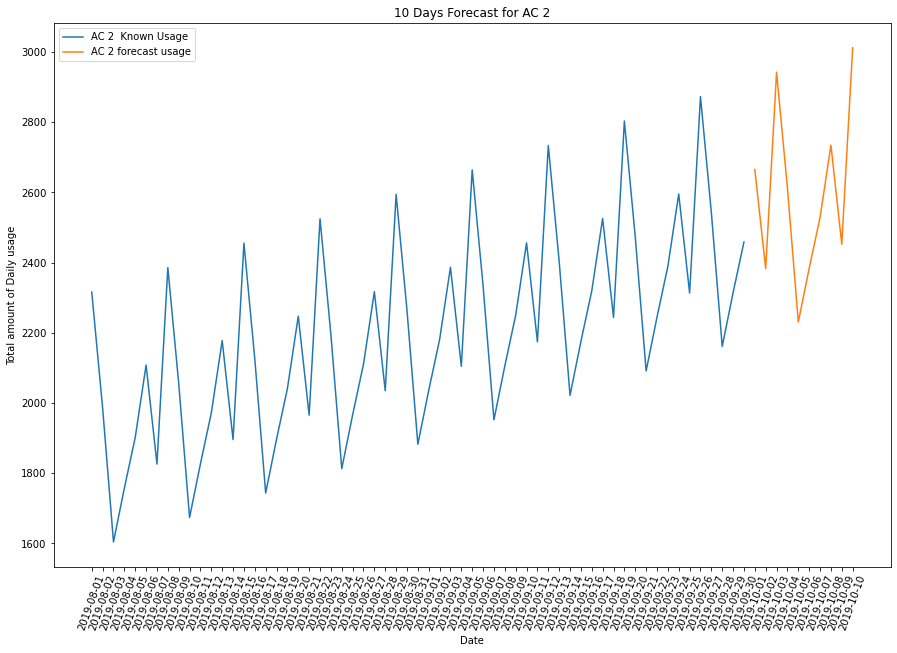

---------------  Forcasted Values for  AC 2   ---------------


,Date,Usage
61,2019-10-01,2665.161648
62,2019-10-02,2383.077585
63,2019-10-03,2942.734990
64,2019-10-04,2612.774594
65,2019-10-05,2230.663584
66,2019-10-06,2383.981212
67,2019-10-07,2528.451559
68,2019-10-08,2734.778830
69,2019-10-09,2452.694767
70,2019-10-10,3012.352172


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


****************************************************************************************************
----------------------------------------------------------------------------------------------------


<Figure size 1296x432 with 0 Axes>

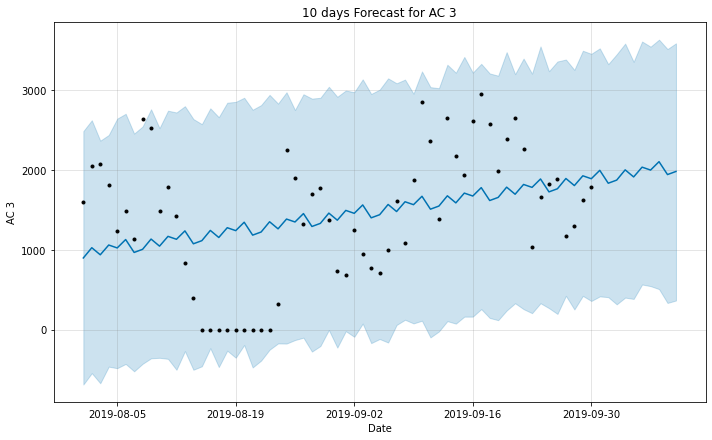

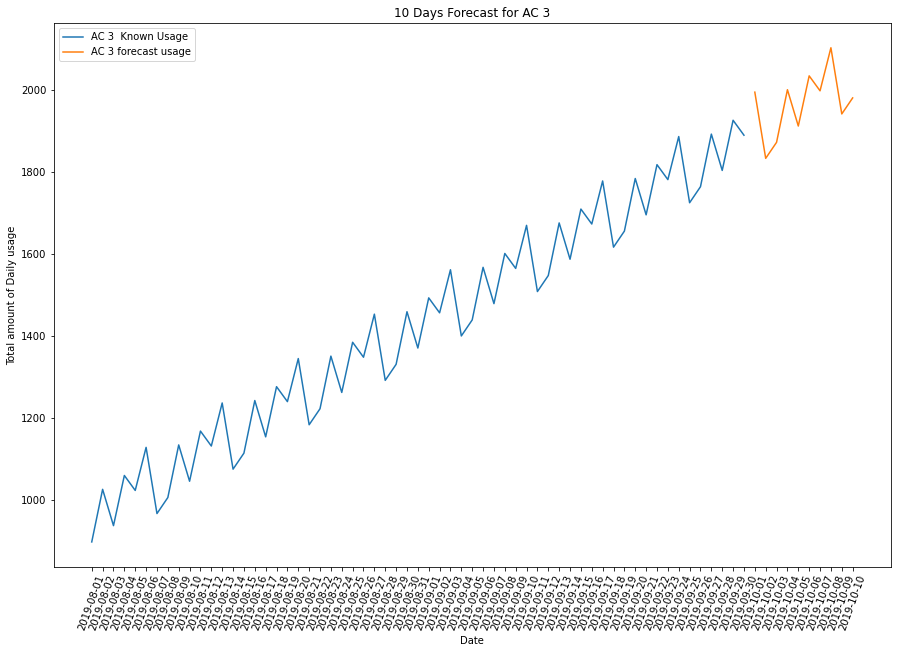

---------------  Forcasted Values for  AC 3   ---------------


,Date,Usage
61,2019-10-01,1993.692191
62,2019-10-02,1832.350341
63,2019-10-03,1871.412607
64,2019-10-04,1999.633526
65,2019-10-05,1911.112543
66,2019-10-06,2033.390117
67,2019-10-07,1996.981535
68,2019-10-08,2101.921422
69,2019-10-09,1940.579572
70,2019-10-10,1979.641837


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


****************************************************************************************************
----------------------------------------------------------------------------------------------------


<Figure size 1296x432 with 0 Axes>

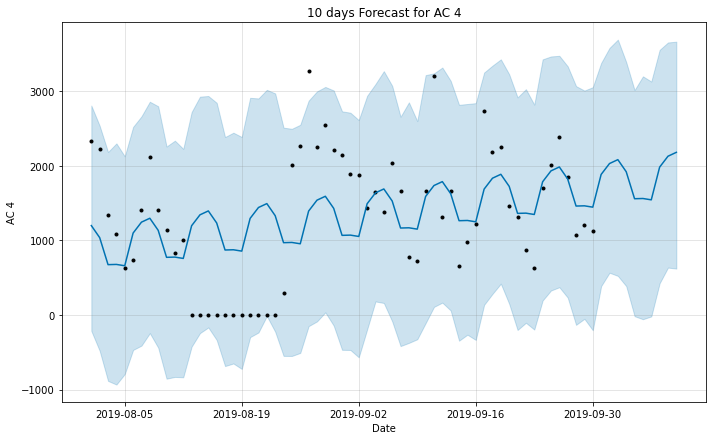

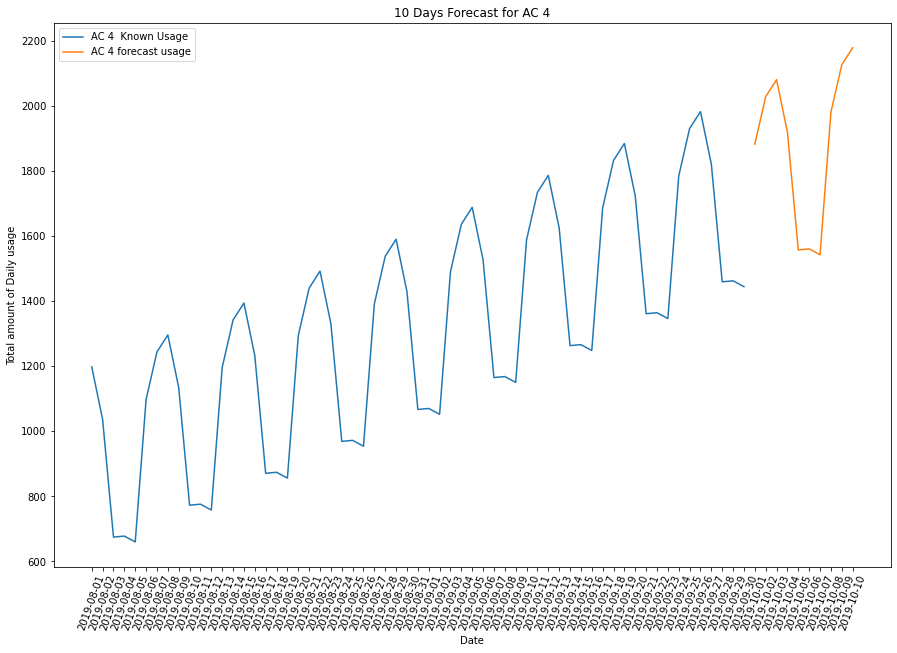

---------------  Forcasted Values for  AC 4   ---------------


,Date,Usage
61,2019-10-01,1883.628845
62,2019-10-02,2029.767797
63,2019-10-03,2082.028877
64,2019-10-04,1920.277945
65,2019-10-05,1558.244717
66,2019-10-06,1561.337943
67,2019-10-07,1543.391180
68,2019-10-08,1981.813191
69,2019-10-09,2127.952143
70,2019-10-10,2180.213223


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


****************************************************************************************************
----------------------------------------------------------------------------------------------------


<Figure size 1296x432 with 0 Axes>

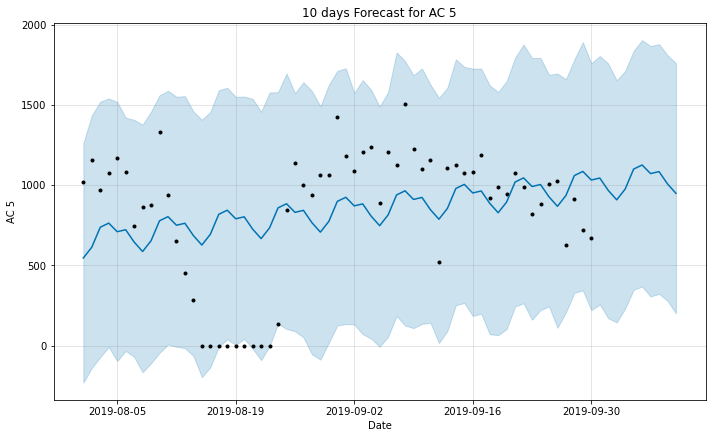

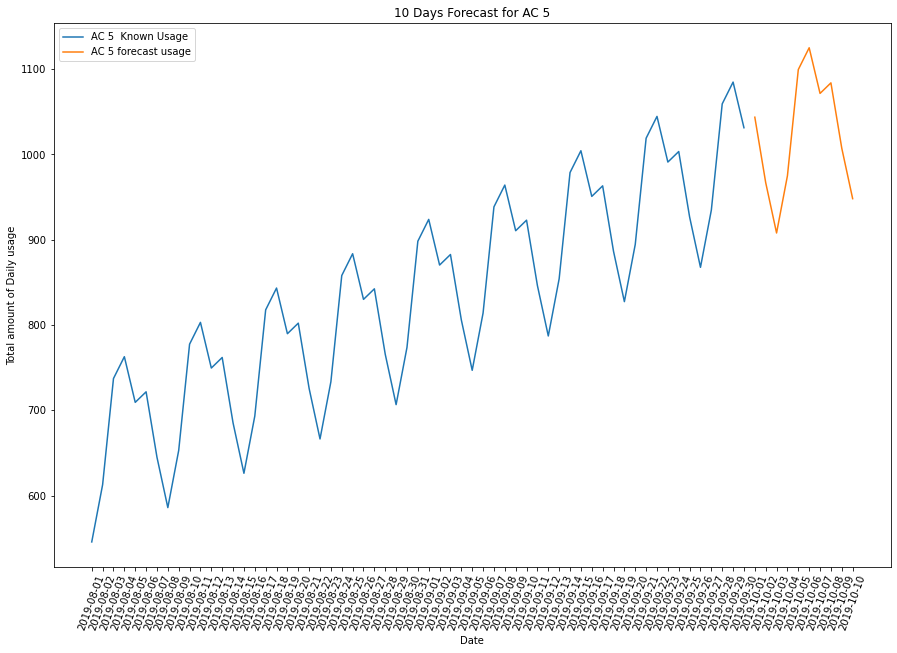

---------------  Forcasted Values for  AC 5   ---------------


,Date,Usage
61,2019-10-01,1043.683531
62,2019-10-02,966.989137
63,2019-10-03,907.893297
64,2019-10-04,975.012622
65,2019-10-05,1099.555680
66,2019-10-06,1125.135112
67,2019-10-07,1071.585769
68,2019-10-08,1083.942603
69,2019-10-09,1007.248209
70,2019-10-10,948.152368


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


****************************************************************************************************
----------------------------------------------------------------------------------------------------


<Figure size 1296x432 with 0 Axes>

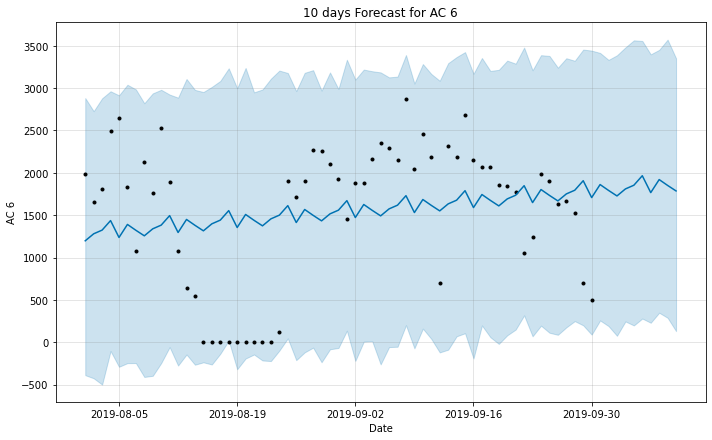

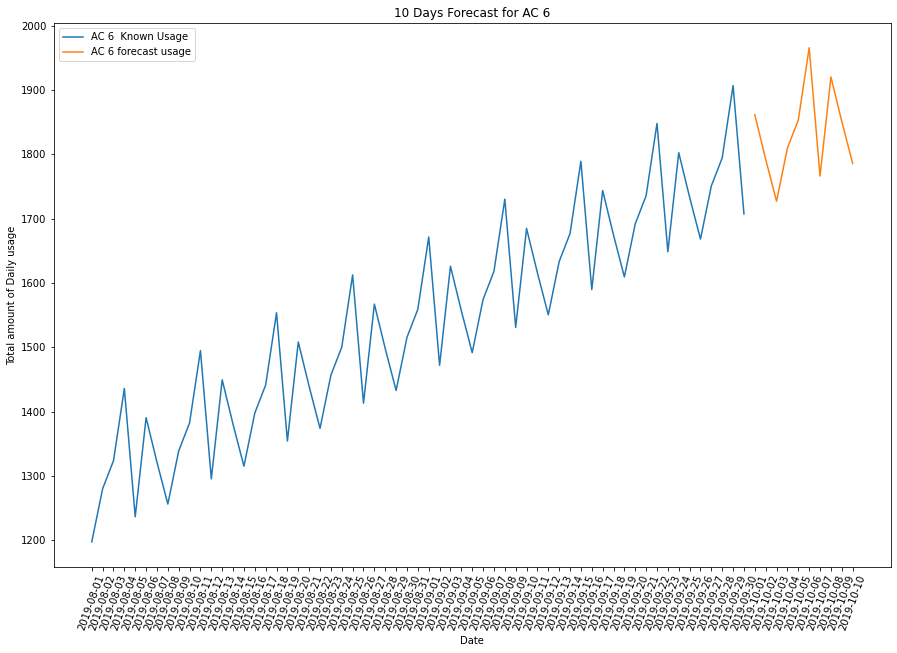

---------------  Forcasted Values for  AC 6   ---------------


,Date,Usage
61,2019-10-01,1861.166088
62,2019-10-02,1792.022082
63,2019-10-03,1726.895495
64,2019-10-04,1809.530714
65,2019-10-05,1853.154834
66,2019-10-06,1965.424669
67,2019-10-07,1766.038743
68,2019-10-08,1920.006262
69,2019-10-09,1850.862256
70,2019-10-10,1785.735669


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


****************************************************************************************************
----------------------------------------------------------------------------------------------------


<Figure size 1296x432 with 0 Axes>

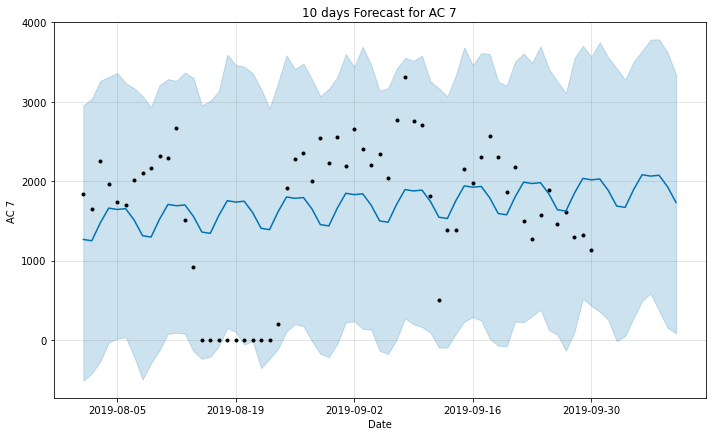

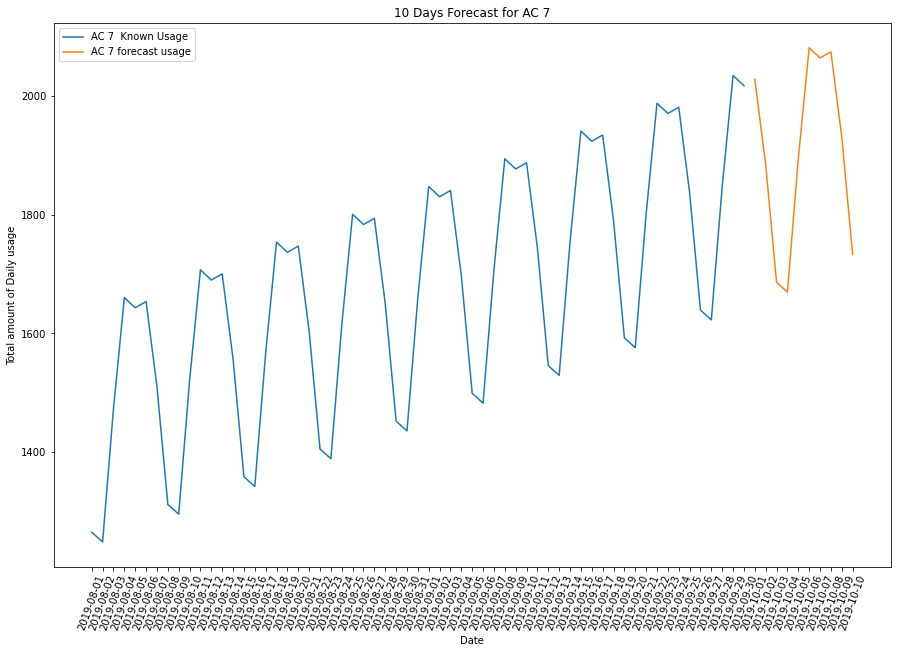

---------------  Forcasted Values for  AC 7   ---------------


,Date,Usage
61,2019-10-01,2027.280761
62,2019-10-02,1883.856180
63,2019-10-03,1685.794305
64,2019-10-04,1669.476754
65,2019-10-05,1894.045996
66,2019-10-06,2080.750881
67,2019-10-07,2063.609575
68,2019-10-08,2074.012442
69,2019-10-09,1930.587861
70,2019-10-10,1732.525986


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


****************************************************************************************************
----------------------------------------------------------------------------------------------------


<Figure size 1296x432 with 0 Axes>

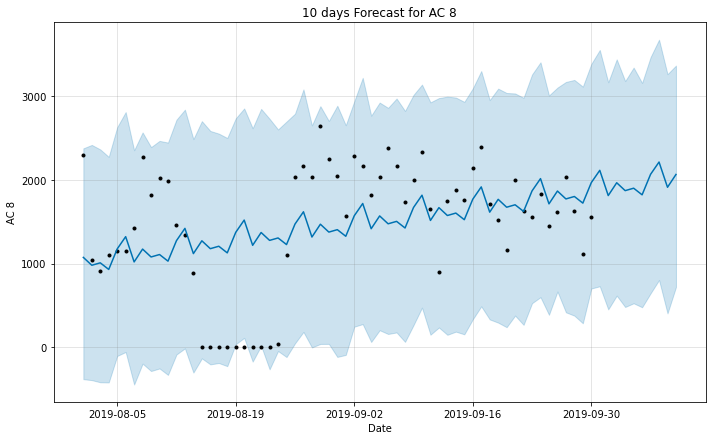

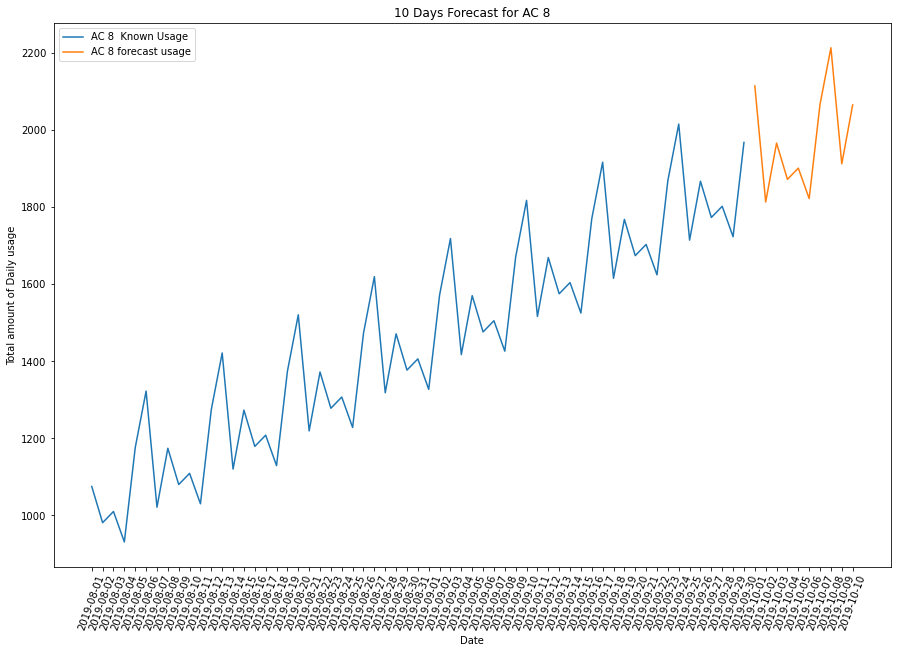

---------------  Forcasted Values for  AC 8   ---------------


,Date,Usage
61,2019-10-01,2115.072496
62,2019-10-02,1813.714375
63,2019-10-03,1966.667741
64,2019-10-04,1872.550244
65,2019-10-05,1901.638652
66,2019-10-06,1822.614693
67,2019-10-07,2067.392823
68,2019-10-08,2214.110227
69,2019-10-09,1912.752105
70,2019-10-10,2065.705472


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


****************************************************************************************************
----------------------------------------------------------------------------------------------------


<Figure size 1296x432 with 0 Axes>

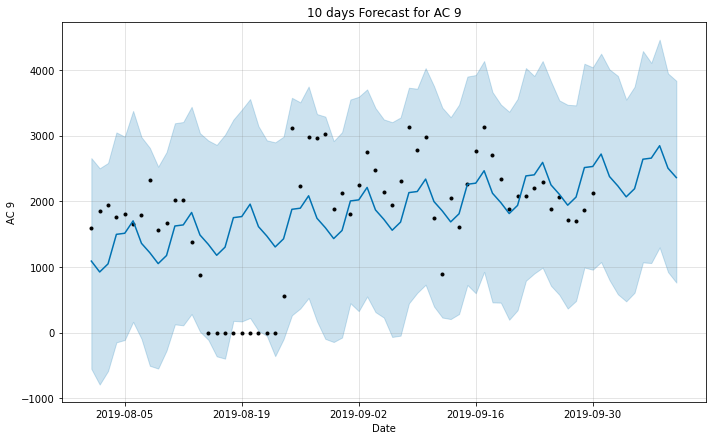

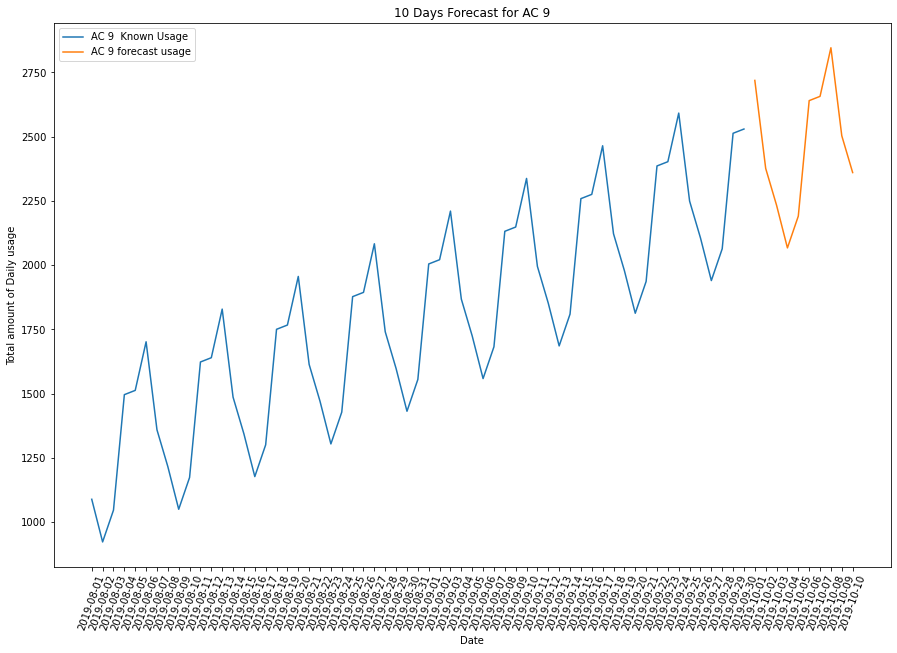

---------------  Forcasted Values for  AC 9   ---------------


,Date,Usage
61,2019-10-01,2718.819609
62,2019-10-02,2376.486820
63,2019-10-03,2233.287892
64,2019-10-04,2067.357117
65,2019-10-05,2191.025870
66,2019-10-06,2640.238354
67,2019-10-07,2656.854441
68,2019-10-08,2845.900913
69,2019-10-09,2503.568123
70,2019-10-10,2360.369196


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


****************************************************************************************************
----------------------------------------------------------------------------------------------------


<Figure size 1296x432 with 0 Axes>

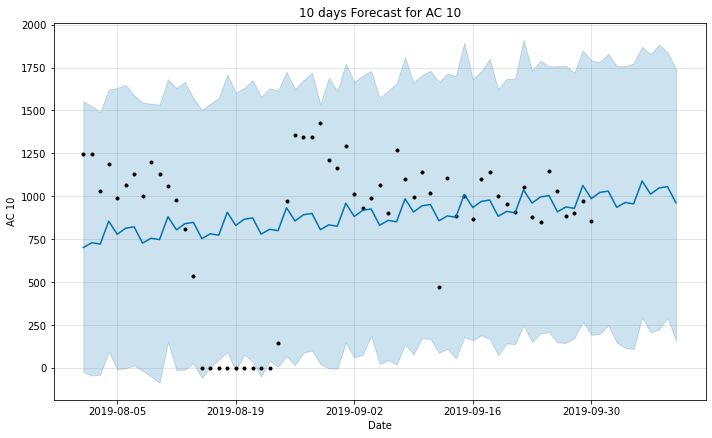

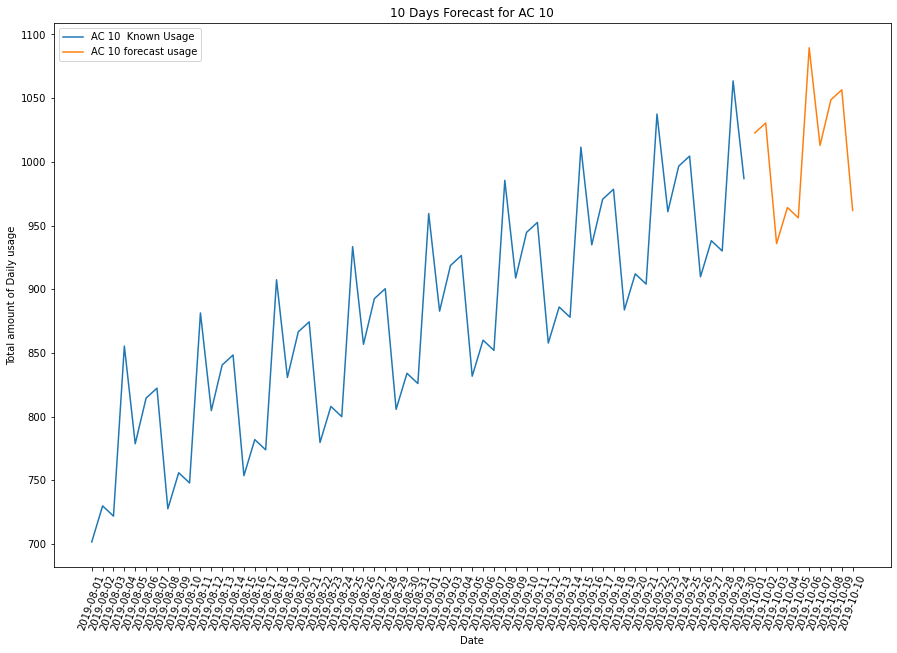

---------------  Forcasted Values for  AC 10   ---------------


,Date,Usage
61,2019-10-01,1022.675369
62,2019-10-02,1030.498077
63,2019-10-03,935.778239
64,2019-10-04,964.088826
65,2019-10-05,956.057578
66,2019-10-06,1089.580999
67,2019-10-07,1012.889625
68,2019-10-08,1048.703302
69,2019-10-09,1056.526011
70,2019-10-10,961.806173


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


****************************************************************************************************
----------------------------------------------------------------------------------------------------


<Figure size 1296x432 with 0 Axes>

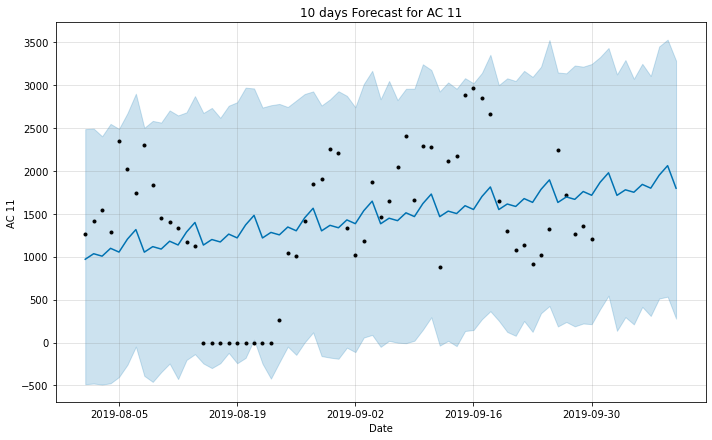

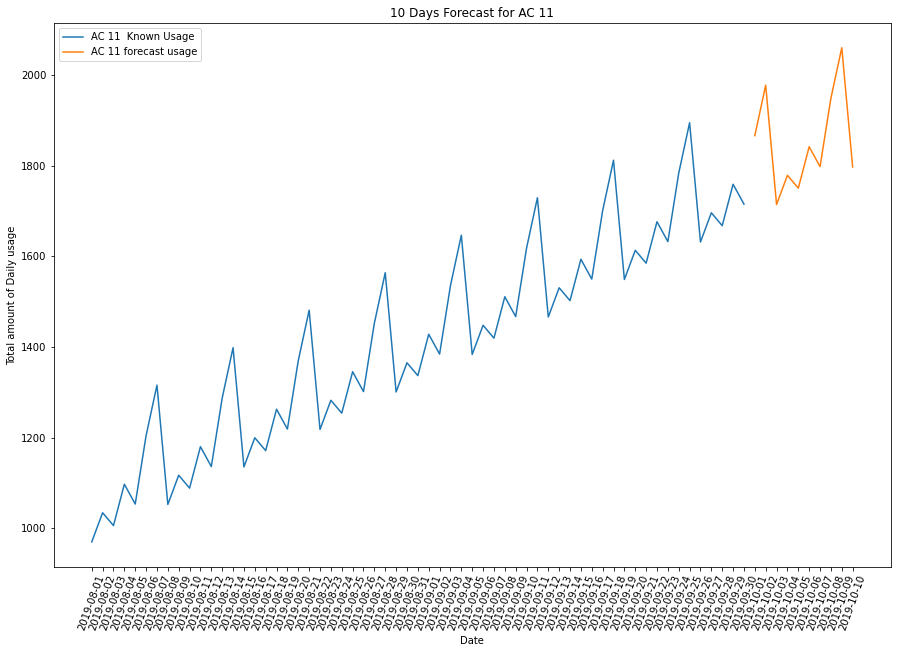

---------------  Forcasted Values for  AC 11   ---------------


,Date,Usage
61,2019-10-01,1865.967663
62,2019-10-02,1977.204805
63,2019-10-03,1714.104071
64,2019-10-04,1778.511320
65,2019-10-05,1750.132994
66,2019-10-06,1841.470745
67,2019-10-07,1797.700528
68,2019-10-08,1948.679403
69,2019-10-09,2059.916545
70,2019-10-10,1796.815812


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


****************************************************************************************************
----------------------------------------------------------------------------------------------------


<Figure size 1296x432 with 0 Axes>

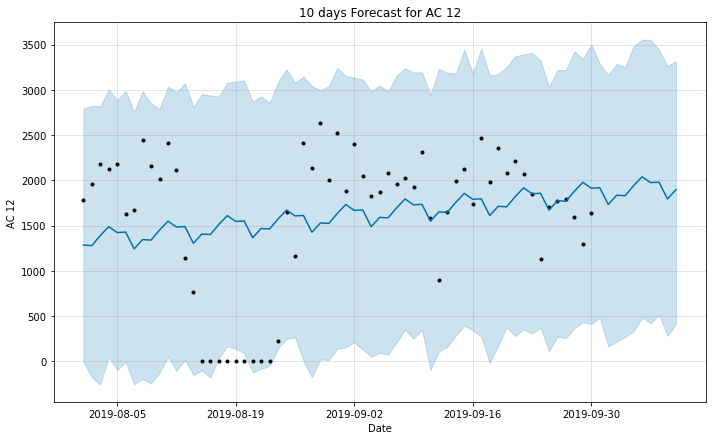

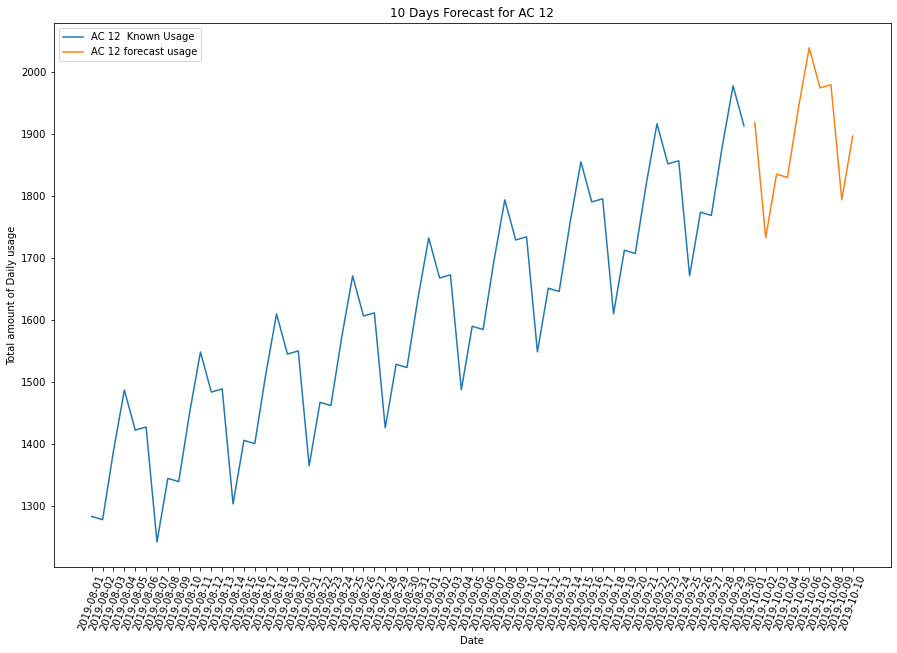

---------------  Forcasted Values for  AC 12   ---------------


,Date,Usage
61,2019-10-01,1917.810296
62,2019-10-02,1732.408556
63,2019-10-03,1834.904688
64,2019-10-04,1829.691489
65,2019-10-05,1940.443907
66,2019-10-06,2038.792070
67,2019-10-07,1974.142922
68,2019-10-08,1979.150804
69,2019-10-09,1793.749064
70,2019-10-10,1896.245196


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


****************************************************************************************************
----------------------------------------------------------------------------------------------------


<Figure size 1296x432 with 0 Axes>

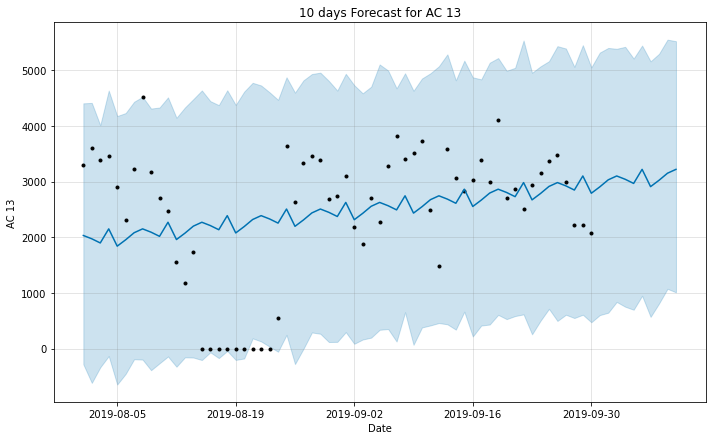

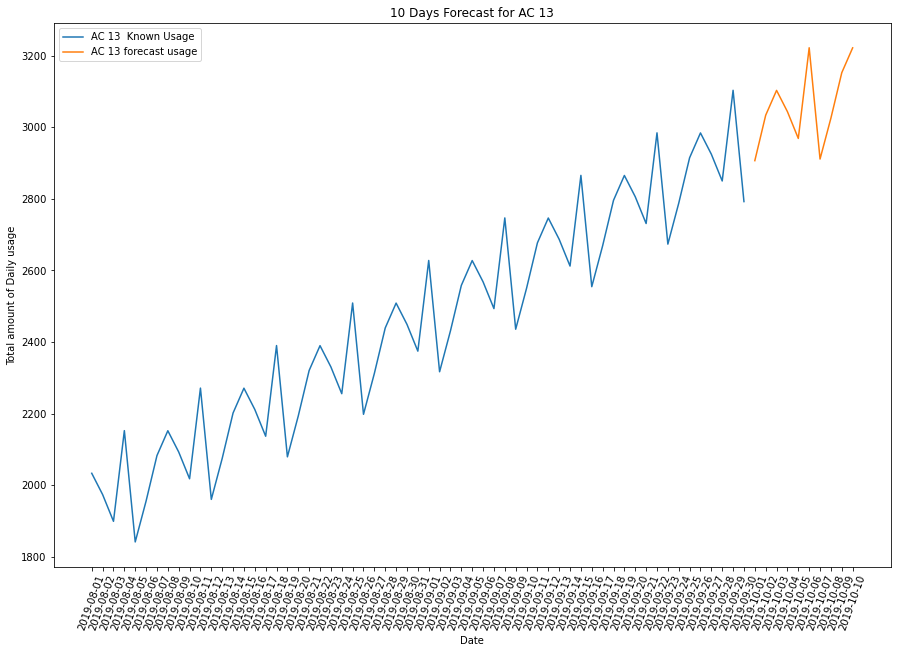

---------------  Forcasted Values for  AC 13   ---------------


,Date,Usage
61,2019-10-01,2906.488396
62,2019-10-02,3033.390864
63,2019-10-03,3102.729056
64,2019-10-04,3043.324855
65,2019-10-05,2968.565065
66,2019-10-06,3221.806356
67,2019-10-07,2911.004744
68,2019-10-08,3025.295793
69,2019-10-09,3152.198261
70,2019-10-10,3221.536453


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


****************************************************************************************************
----------------------------------------------------------------------------------------------------


<Figure size 1296x432 with 0 Axes>

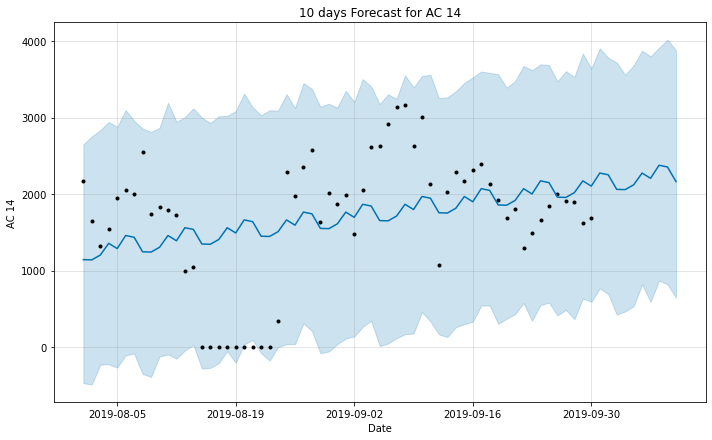

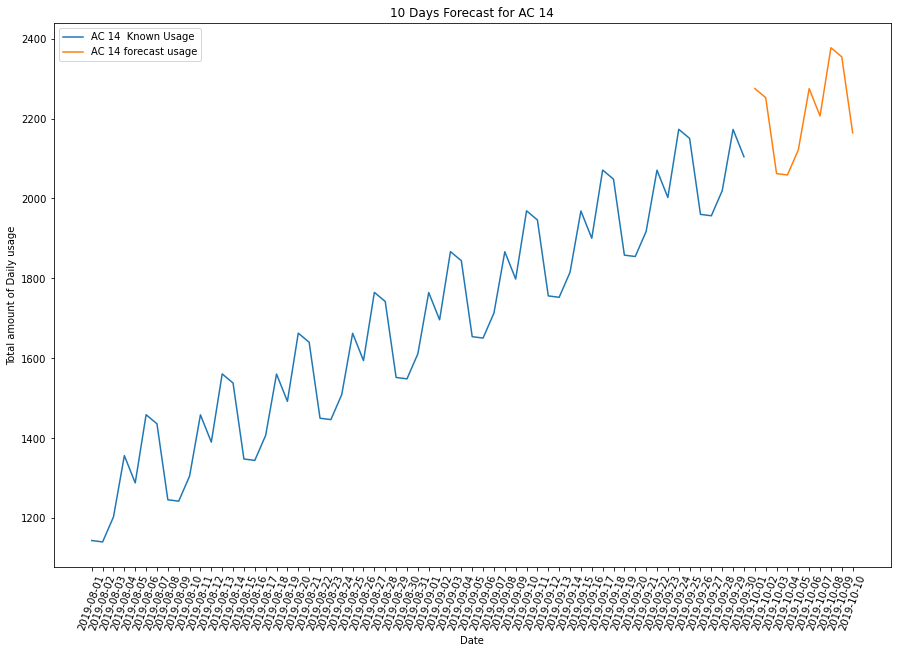

---------------  Forcasted Values for  AC 14   ---------------


,Date,Usage
61,2019-10-01,2275.060888
62,2019-10-02,2252.293606
63,2019-10-03,2062.270102
64,2019-10-04,2058.767545
65,2019-10-05,2121.405042
66,2019-10-06,2274.715766
67,2019-10-07,2206.428030
68,2019-10-08,2377.046743
69,2019-10-09,2354.279461
70,2019-10-10,2164.255957


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


****************************************************************************************************
----------------------------------------------------------------------------------------------------


<Figure size 1296x432 with 0 Axes>

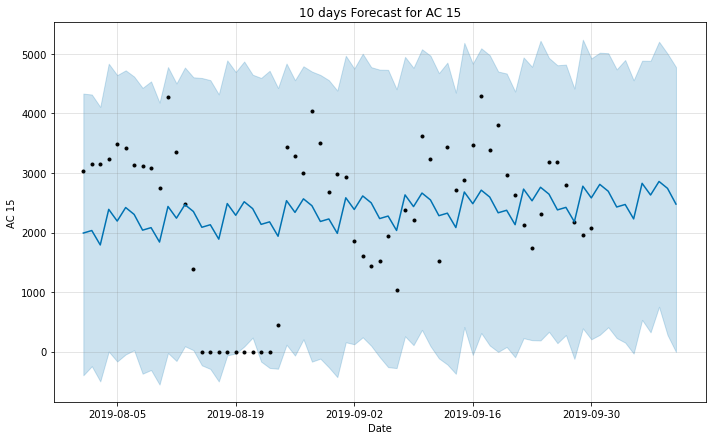

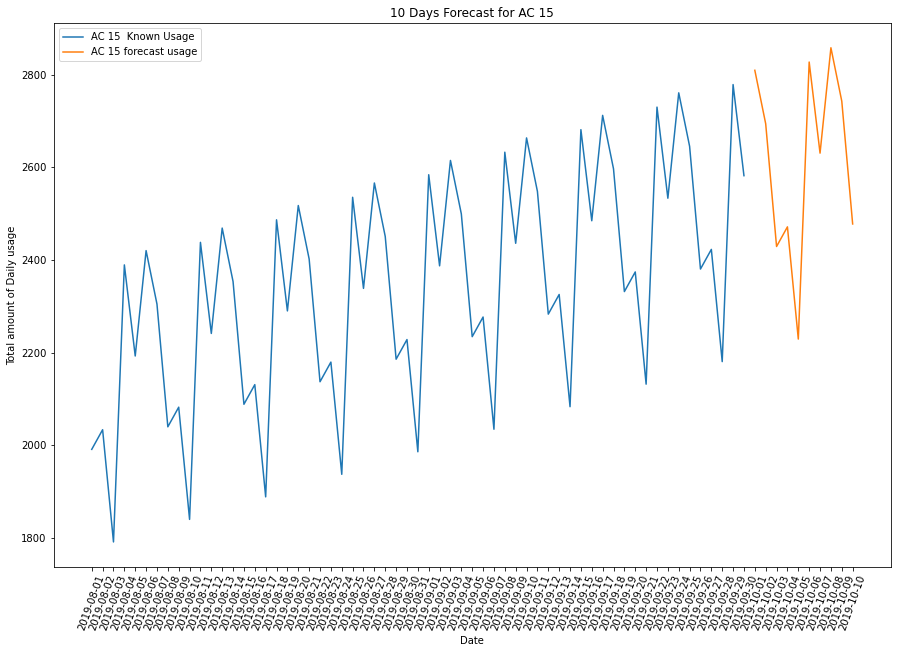

---------------  Forcasted Values for  AC 15   ---------------


,Date,Usage
61,2019-10-01,2809.108043
62,2019-10-02,2693.737471
63,2019-10-03,2428.960398
64,2019-10-04,2471.340993
65,2019-10-05,2229.243032
66,2019-10-06,2826.923870
67,2019-10-07,2630.381203
68,2019-10-08,2857.735802
69,2019-10-09,2742.365230
70,2019-10-10,2477.588157


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


****************************************************************************************************
----------------------------------------------------------------------------------------------------


<Figure size 1296x432 with 0 Axes>

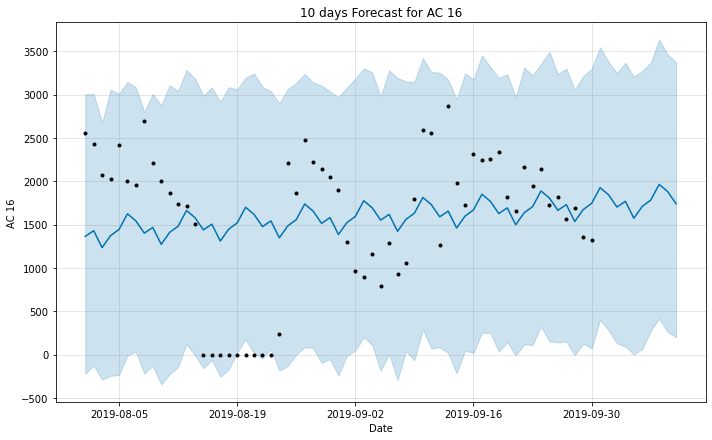

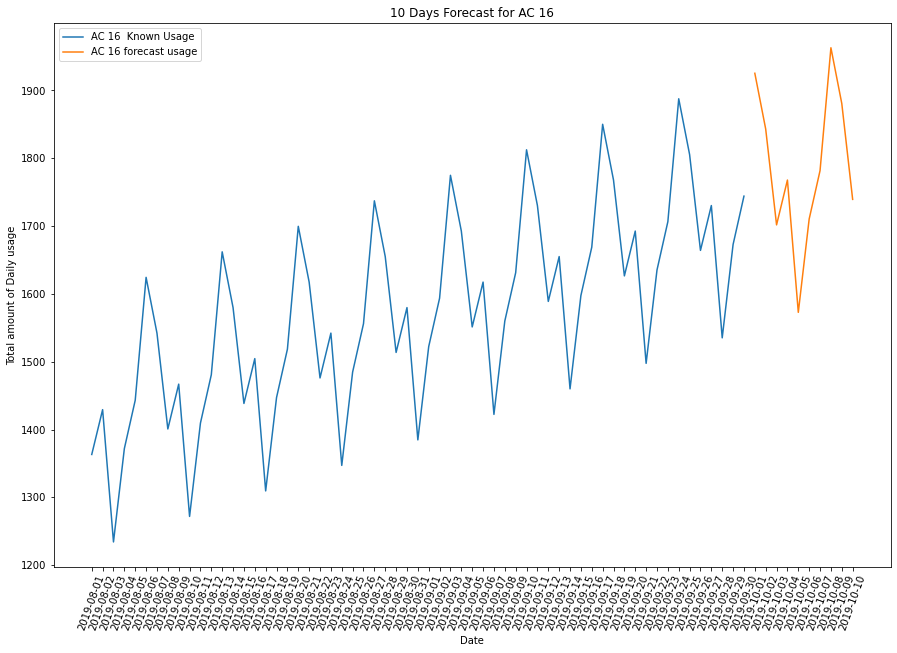

---------------  Forcasted Values for  AC 16   ---------------


,Date,Usage
61,2019-10-01,1925.372722
62,2019-10-02,1843.134257
63,2019-10-03,1701.789644
64,2019-10-04,1767.894760
65,2019-10-05,1572.812516
66,2019-10-06,1710.472153
67,2019-10-07,1781.791943
68,2019-10-08,1962.993570
69,2019-10-09,1880.755104
70,2019-10-10,1739.410491


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


****************************************************************************************************
----------------------------------------------------------------------------------------------------


<Figure size 1296x432 with 0 Axes>

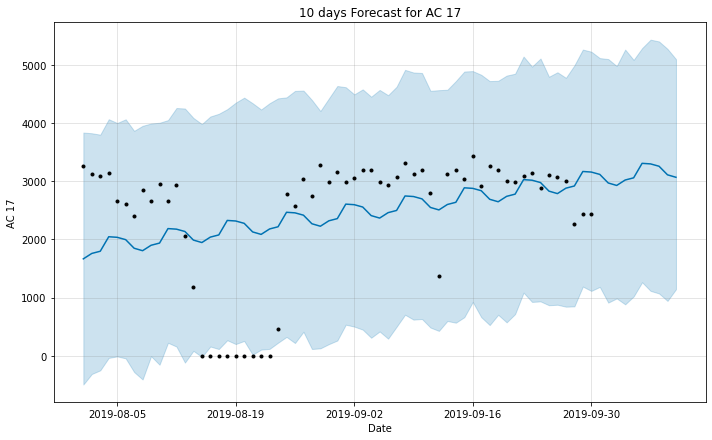

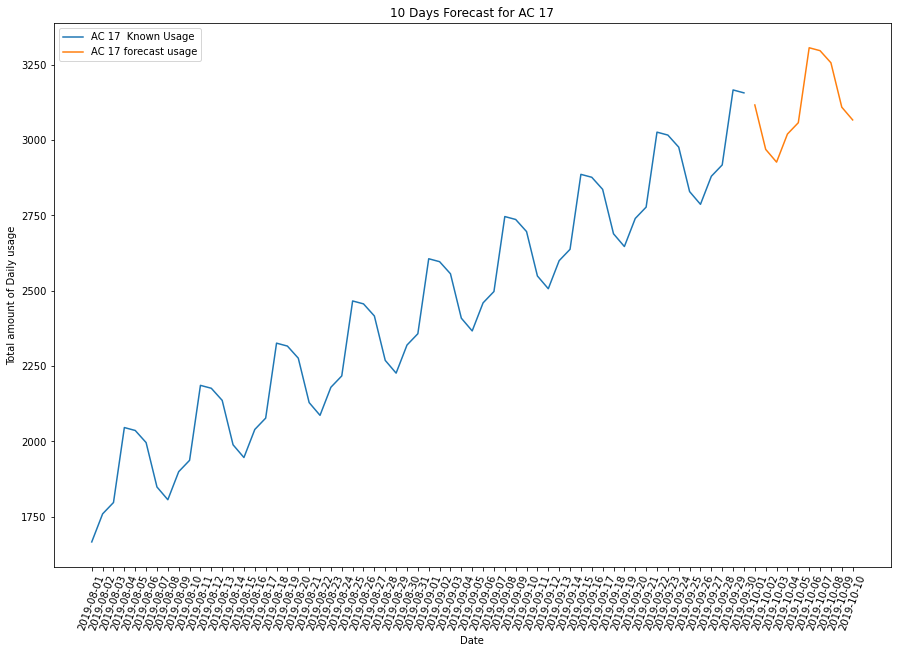

---------------  Forcasted Values for  AC 17   ---------------


,Date,Usage
61,2019-10-01,3116.583916
62,2019-10-02,2969.192045
63,2019-10-03,2926.886014
64,2019-10-04,3020.020673
65,2019-10-05,3057.680025
66,2019-10-06,3306.462714
67,2019-10-07,3296.781266
68,2019-10-08,3256.634682
69,2019-10-09,3109.242810
70,2019-10-10,3066.936779


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


****************************************************************************************************
----------------------------------------------------------------------------------------------------


<Figure size 1296x432 with 0 Axes>

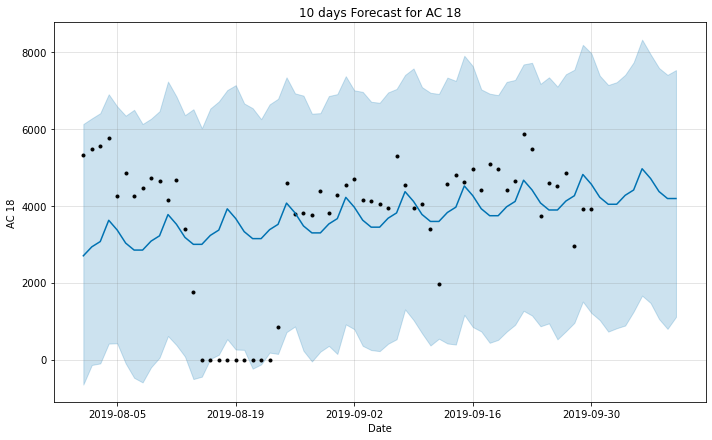

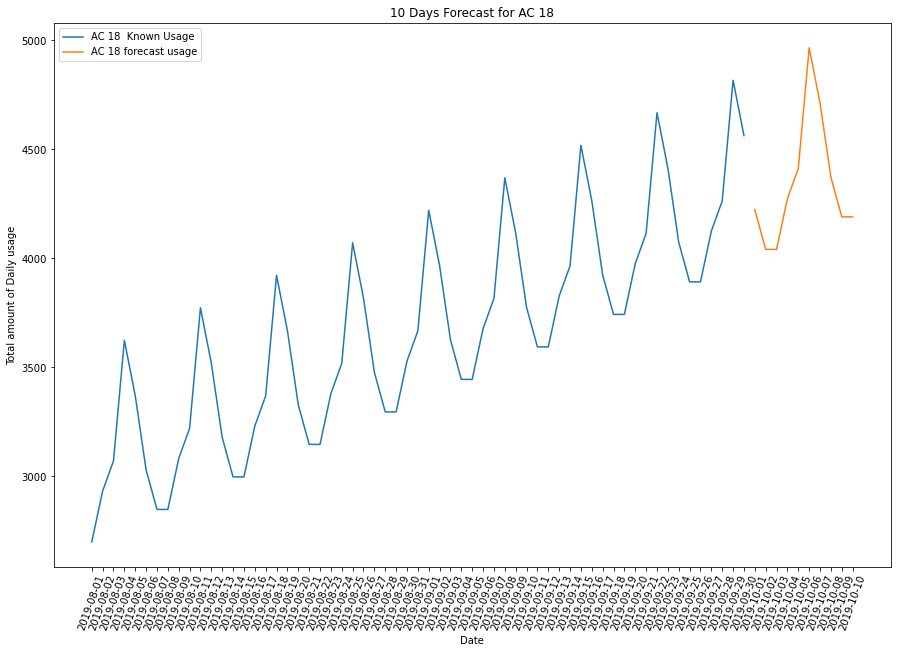

---------------  Forcasted Values for  AC 18   ---------------


,Date,Usage
61,2019-10-01,4223.061050
62,2019-10-02,4041.532884
63,2019-10-03,4041.393613
64,2019-10-04,4274.424121
65,2019-10-05,4412.818637
66,2019-10-06,4966.141583
67,2019-10-07,4712.495383
68,2019-10-08,4372.136816
69,2019-10-09,4190.608650
70,2019-10-10,4190.469379


In [18]:
for ac in df:
    f_model = get_df_forecast_model(daily_sum,ac)
    show_forecast_results(f_model,ac)
